<a href="https://colab.research.google.com/github/Girija-Mishra/Fire-types-classification./blob/main/Defforestation_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import  accuracy_score,classification_report,ConfusionMatrixDisplay
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.preprocessing import LabelEncoder, OneHotEncoder


In [ ]:
from google.colab import files
uploaded= files.upload()

Saving modis_2021_India.csv to modis_2021_India.csv


In [ ]:
from google.colab import files
uploaded= files.upload()

Saving modis_2022_India.csv to modis_2022_India.csv


In [ ]:
from google.colab import files
uploaded= files.upload()

Saving modis_2023_India.csv to modis_2023_India.csv


In [ ]:
df1 = pd.read_csv('modis_2021_India.csv')
df2 = pd.read_csv('modis_2022_India.csv')
df3 = pd.read_csv('modis_2023_India.csv')

In [ ]:
df1.head() # print first 5 rows - df1.tail()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
0,28.0993,96.9983,303.0,1.1,1.1,2021-01-01,409,Terra,MODIS,44,6.03,292.6,8.6,D,0
1,30.0420,79.6492,301.8,1.4,1.2,2021-01-01,547,Terra,MODIS,37,6.03,287.4,9.0,D,0
2,30.0879,78.8579,300.2,1.3,1.1,2021-01-01,547,Terra,MODIS,8,6.03,286.5,5.4,D,0
3,30.0408,80.0501,302.0,1.5,1.2,2021-01-01,547,Terra,MODIS,46,6.03,287.7,10.7,D,0
4,30.6565,78.9668,300.9,1.3,1.1,2021-01-01,547,Terra,MODIS,43,6.03,287.6,9.0,D,0


In [ ]:
df2.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
0,30.1138,80.0756,300.0,1.2,1.1,2022-01-01,511,Terra,MODIS,7,6.03,288.4,7.1,D,0
1,23.7726,86.2078,306.1,1.6,1.2,2022-01-01,512,Terra,MODIS,62,6.03,293.5,10.4,D,2
2,22.2080,84.8627,304.8,1.4,1.2,2022-01-01,512,Terra,MODIS,42,6.03,293.3,5.8,D,2
3,23.7621,86.3946,306.9,1.6,1.2,2022-01-01,512,Terra,MODIS,38,6.03,295.2,9.3,D,2
4,23.6787,86.0891,303.6,1.5,1.2,2022-01-01,512,Terra,MODIS,52,6.03,293.1,7.2,D,2


In [ ]:
df3.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
0,9.3280,77.6247,318.0,1.1,1.0,2023-01-01,821,Aqua,MODIS,62,61.03,305.0,7.6,D,0
1,10.4797,77.9378,313.8,1.0,1.0,2023-01-01,822,Aqua,MODIS,58,61.03,299.4,4.3,D,0
2,13.2478,77.2639,314.7,1.0,1.0,2023-01-01,822,Aqua,MODIS,55,61.03,302.4,4.9,D,0
3,12.2994,78.4085,314.3,1.0,1.0,2023-01-01,822,Aqua,MODIS,58,61.03,301.9,4.8,D,0
4,14.1723,75.5024,338.4,1.2,1.1,2023-01-01,823,Aqua,MODIS,88,61.03,305.3,41.5,D,0


In [ ]:
df = pd.concat([df1, df2, df3], ignore_index=True)
df.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
0,28.0993,96.9983,303.0,1.1,1.1,2021-01-01,409,Terra,MODIS,44,6.03,292.6,8.6,D,0
1,30.0420,79.6492,301.8,1.4,1.2,2021-01-01,547,Terra,MODIS,37,6.03,287.4,9.0,D,0
2,30.0879,78.8579,300.2,1.3,1.1,2021-01-01,547,Terra,MODIS,8,6.03,286.5,5.4,D,0
3,30.0408,80.0501,302.0,1.5,1.2,2021-01-01,547,Terra,MODIS,46,6.03,287.7,10.7,D,0
4,30.6565,78.9668,300.9,1.3,1.1,2021-01-01,547,Terra,MODIS,43,6.03,287.6,9.0,D,0


In [ ]:
df.shape # rows and cols

(271217, 15)

In [ ]:
df.info() # dt, memc

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271217 entries, 0 to 271216
Data columns (total 15 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   latitude    271217 non-null  float64
 1   longitude   271217 non-null  float64
 2   brightness  271217 non-null  float64
 3   scan        271217 non-null  float64
 4   track       271217 non-null  float64
 5   acq_date    271217 non-null  object 
 6   acq_time    271217 non-null  int64  
 7   satellite   271217 non-null  object 
 8   instrument  271217 non-null  object 
 9   confidence  271217 non-null  int64  
 10  version     271217 non-null  float64
 11  bright_t31  271217 non-null  float64
 12  frp         271217 non-null  float64
 13  daynight    271217 non-null  object 
 14  type        271217 non-null  int64  
dtypes: float64(8), int64(3), object(4)
memory usage: 31.0+ MB


In [ ]:
# Any missing values?
df.isnull().sum()

,0
latitude,0
longitude,0
brightness,0
scan,0
track,0
acq_date,0
acq_time,0
satellite,0
instrument,0
confidence,0


In [ ]:
df.duplicated().sum()


np.int64(0)

In [ ]:
# List out column names to check
df.columns

Index(['latitude', 'longitude', 'brightness', 'scan', 'track', 'acq_date',
       'acq_time', 'satellite', 'instrument', 'confidence', 'version',
       'bright_t31', 'frp', 'daynight', 'type'],
      dtype='object')

In [ ]:
df.describe().T # statistics of dataset - numbers!

,count,mean,std,min,25%,50%,75%,max
latitude,271217.0,23.947505,4.919846,8.1362,20.9655,23.7888,27.7827,34.9734
longitude,271217.0,81.284024,6.559071,68.4526,75.8802,79.3209,84.7559,97.1044
brightness,271217.0,323.719192,14.147221,300.0000,314.5000,322.0000,330.7000,505.7000
scan,271217.0,1.421732,0.630742,1.0000,1.0000,1.2000,1.5000,4.8000
track,271217.0,1.152716,0.201943,1.0000,1.0000,1.1000,1.2000,2.0000
acq_time,271217.0,824.623755,353.966965,321.0000,648.0000,756.0000,825.0000,2202.0000
confidence,271217.0,64.065081,18.165329,0.0000,54.0000,66.0000,76.0000,100.0000
version,271217.0,21.933778,24.935515,6.0300,6.0300,6.0300,61.0300,61.0300
bright_t31,271217.0,303.499177,8.282440,267.2000,298.2000,302.5000,309.2000,400.1000
frp,271217.0,27.722058,81.017471,0.0000,8.7000,13.5000,24.5000,6961.8000


In [ ]:
# Check Unique values of target variable
df.type.value_counts()

,count
type,
0,257625
2,13550
3,42


In [ ]:
# Check unique and n unique for all categorical features
for col in df.columns:
  if df[col].dtype == 'object':
    print(f"Column: {col}")
    print(f"Unique values: {df[col].unique()}")
    print(f"Number of unique values: {df[col].nunique()}")
    print("-" * 50)

Column: acq_date
Unique values: ['2021-01-01' '2021-01-02' '2021-01-03' ... '2023-12-29' '2023-12-30'
 '2023-12-31']
Number of unique values: 1088
--------------------------------------------------
Column: satellite
Unique values: ['Terra' 'Aqua']
Number of unique values: 2
--------------------------------------------------
Column: instrument
Unique values: ['MODIS']
Number of unique values: 1
--------------------------------------------------
Column: daynight
Unique values: ['D' 'N']
Number of unique values: 2
--------------------------------------------------


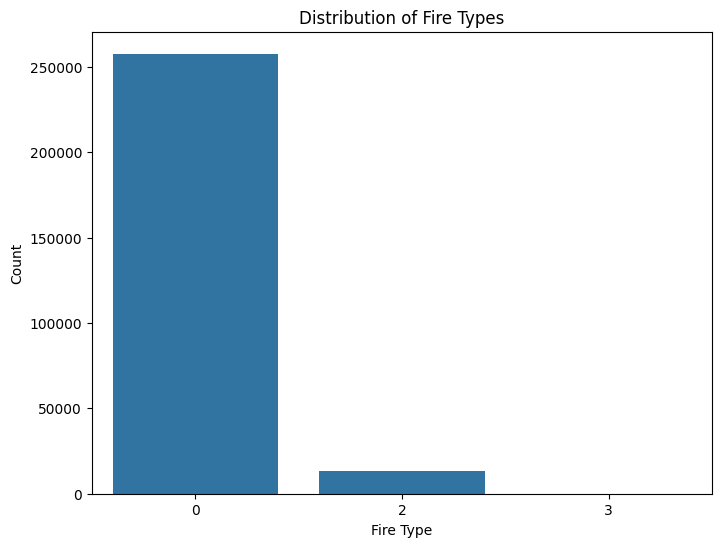

In [ ]:
# Count plot for 'type'
plt.figure(figsize=(8, 6))
sns.countplot(x='type', data=df)
plt.title('Distribution of Fire Types')
plt.xlabel('Fire Type')
plt.ylabel('Count')
plt.show()


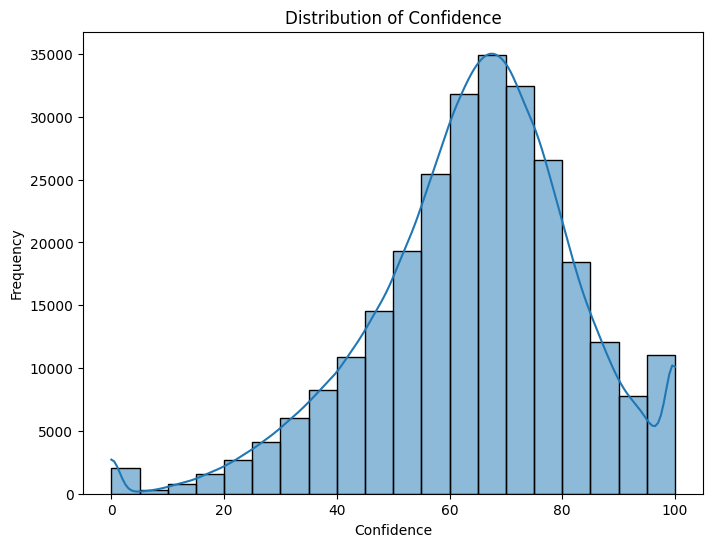

In [ ]:
# Histogram of 'confidence'
plt.figure(figsize=(8, 6))
sns.histplot(df['confidence'], bins=20, kde=True)
plt.title('Distribution of Confidence')
plt.xlabel('Confidence')
plt.ylabel('Frequency')
plt.show()

In [ ]:
from google.colab import files
uploaded = files.upload()






Saving modis_2021_India.csv to modis_2021_India.csv


In [ ]:
from google.colab import files
uploaded = files.upload()


Saving modis_2022_India.csv to modis_2022_India.csv


In [ ]:
from google.colab import files
uploaded = files.upload()


Saving modis_2023_India.csv to modis_2023_India.csv


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


In [ ]:
import os

for file in os.listdir():
    if file.endswith('.csv'):
        print(file)


modis_2022_India.csv
modis_2023_India.csv
modis_2021_India.csv


In [ ]:
import pandas as pd

df = pd.read_csv('modis_2023_India.csv')
df.head()



,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
0,9.3280,77.6247,318.0,1.1,1.0,2023-01-01,821,Aqua,MODIS,62,61.03,305.0,7.6,D,0
1,10.4797,77.9378,313.8,1.0,1.0,2023-01-01,822,Aqua,MODIS,58,61.03,299.4,4.3,D,0
2,13.2478,77.2639,314.7,1.0,1.0,2023-01-01,822,Aqua,MODIS,55,61.03,302.4,4.9,D,0
3,12.2994,78.4085,314.3,1.0,1.0,2023-01-01,822,Aqua,MODIS,58,61.03,301.9,4.8,D,0
4,14.1723,75.5024,338.4,1.2,1.1,2023-01-01,823,Aqua,MODIS,88,61.03,305.3,41.5,D,0


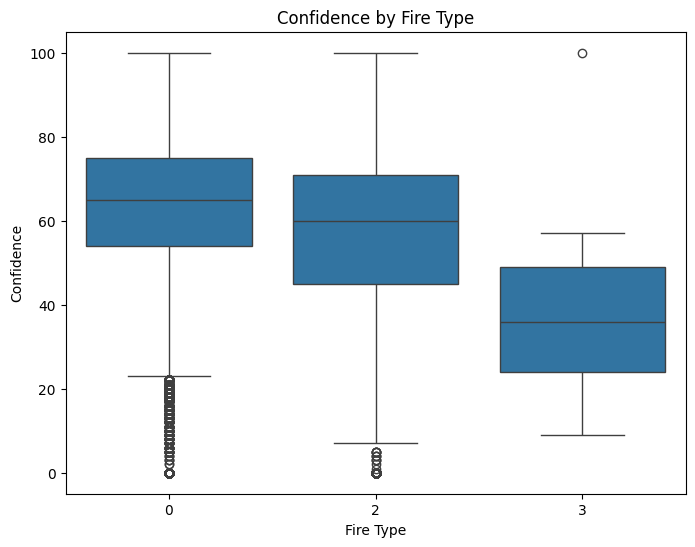

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
df = pd.read_csv('modis_2023_India.csv')

# Create the boxplot
plt.figure(figsize=(8, 6))
sns.boxplot(x='type', y='confidence', data=df)
plt.title('Confidence by Fire Type')
plt.xlabel('Fire Type')
plt.ylabel('Confidence')
plt.show()


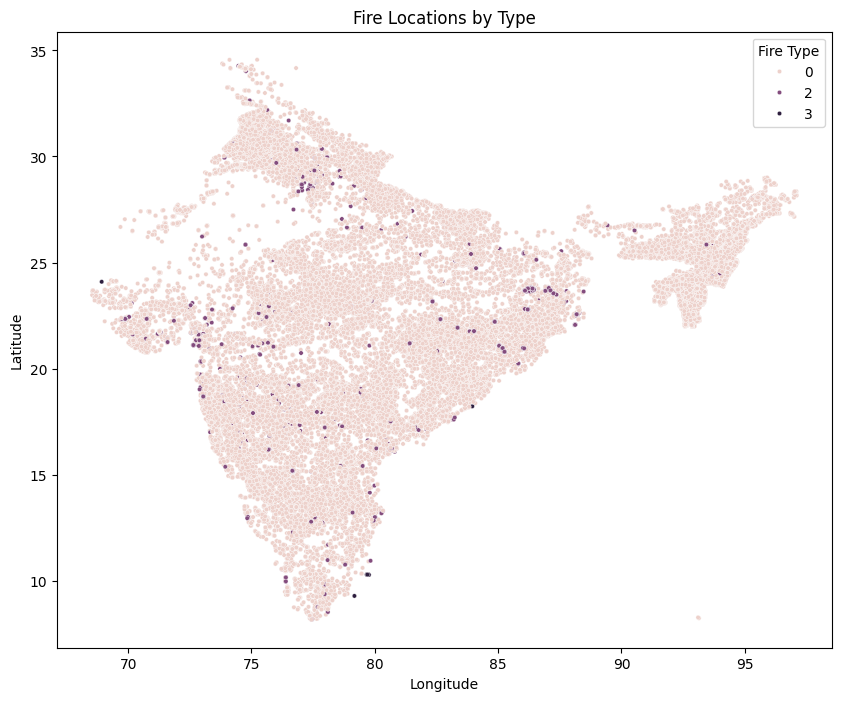

In [ ]:
# Scatter plot of 'latitude' vs 'longitude'
plt.figure(figsize=(10, 8))
sns.scatterplot(x='longitude', y='latitude', data=df, hue='type', s=10)
plt.title('Fire Locations by Type')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(title='Fire Type')
plt.show()


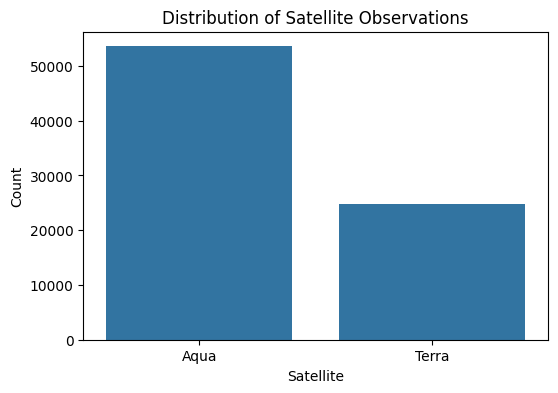

In [ ]:
# Count plot for 'Satellite'
plt.figure(figsize=(6, 4))
sns.countplot(x='satellite', data=df)
plt.title('Distribution of Satellite Observations')
plt.xlabel('Satellite')
plt.ylabel('Count')
plt.show()

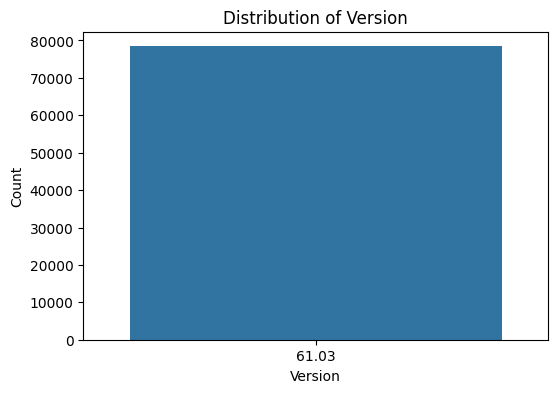

In [ ]:
# Count plot for 'version'
plt.figure(figsize=(6, 4))
sns.countplot(x='version', data=df)
plt.title('Distribution of Version')
plt.xlabel('Version')
plt.ylabel('Count')
plt.show()

In [ ]:
#this code take more time
#Pairplot for numerical features (subset)
#sns.pairplot(df[['latitude', 'longitude', 'brightness', 'confidence', 'frp', 'type']], hue='type', diag_kind='kde')
#plt.suptitle('Pairplot of Numerical Features')
#plt.show()


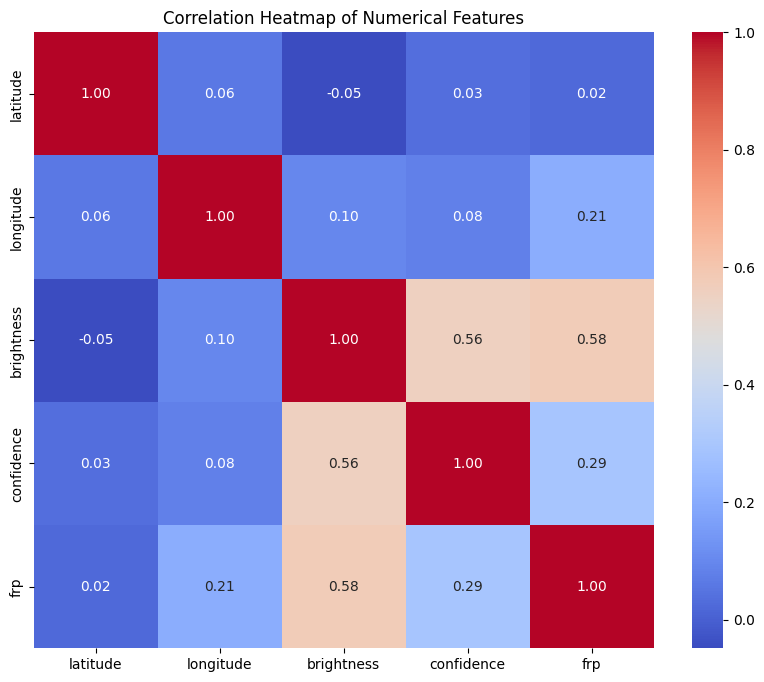

In [ ]:
# Heatmap of correlations between numerical features
plt.figure(figsize=(10, 8))
correlation_matrix = df[['latitude', 'longitude', 'brightness', 'confidence', 'frp']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap of Numerical Features')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

df = pd.read_csv('modis_2023_India.csv')
numerical_cols = df.select_dtypes(include=np.number).columns
print(numerical_cols)


Index(['latitude', 'longitude', 'brightness', 'scan', 'track', 'acq_time',
       'confidence', 'version', 'bright_t31', 'frp', 'type'],
      dtype='object')


In [ ]:
numerical_cols

Index(['latitude', 'longitude', 'brightness', 'scan', 'track', 'acq_time',
       'confidence', 'version', 'bright_t31', 'frp', 'type'],
      dtype='object')

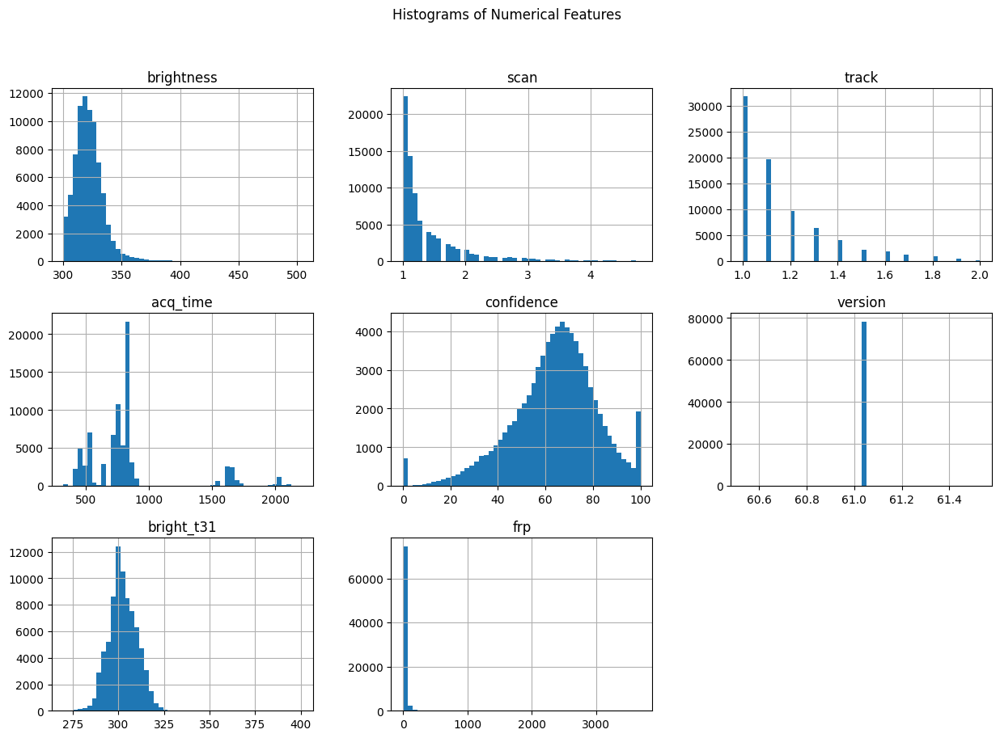

In [ ]:
numerical_cols = ['brightness', 'scan', 'track', 'acq_time','confidence', 'version', 'bright_t31', 'frp']
df[numerical_cols].hist(bins=50, figsize=(15, 10))
plt.suptitle('Histograms of Numerical Features')
plt.show()

Analyzing distribution for: brightness


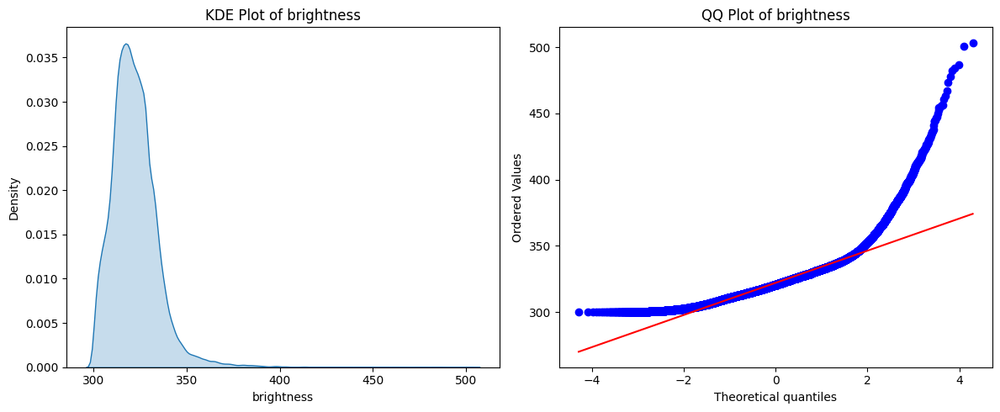

--------------------------------------------------
Analyzing distribution for: confidence


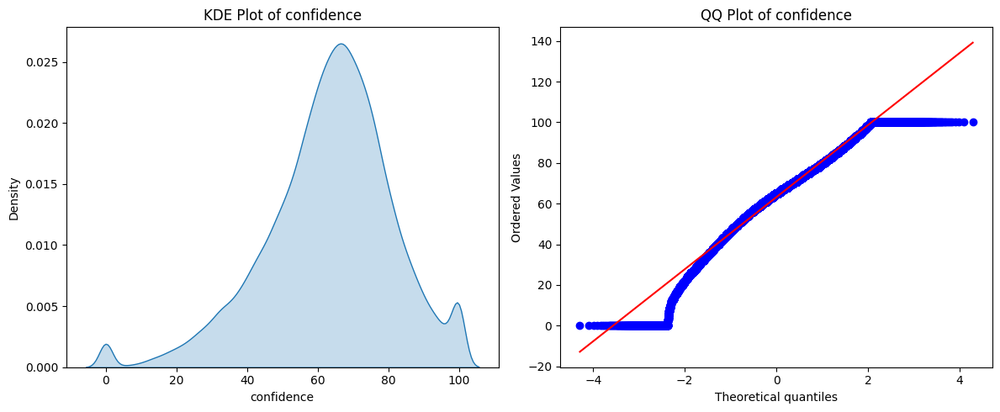

--------------------------------------------------
Analyzing distribution for: frp


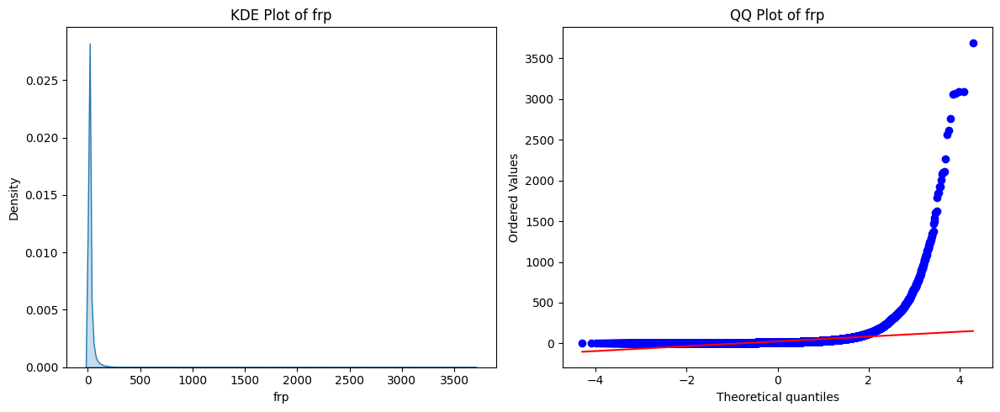

--------------------------------------------------
Analyzing distribution for: bright_t31


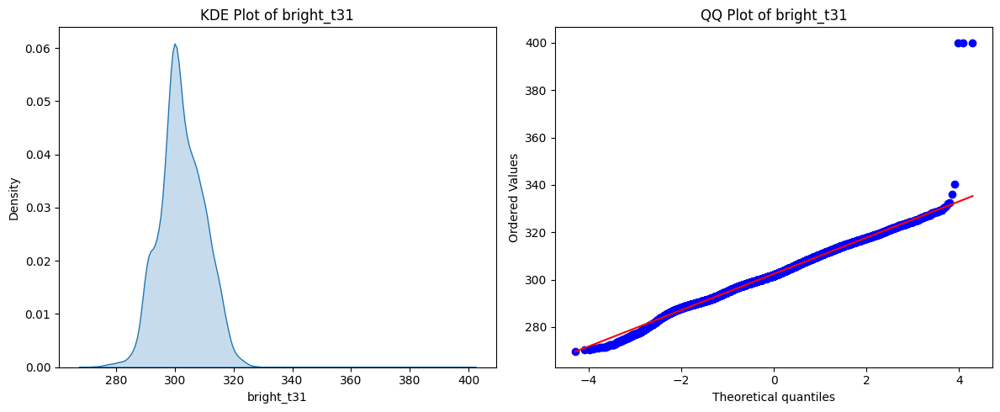

--------------------------------------------------
Analyzing distribution for: scan


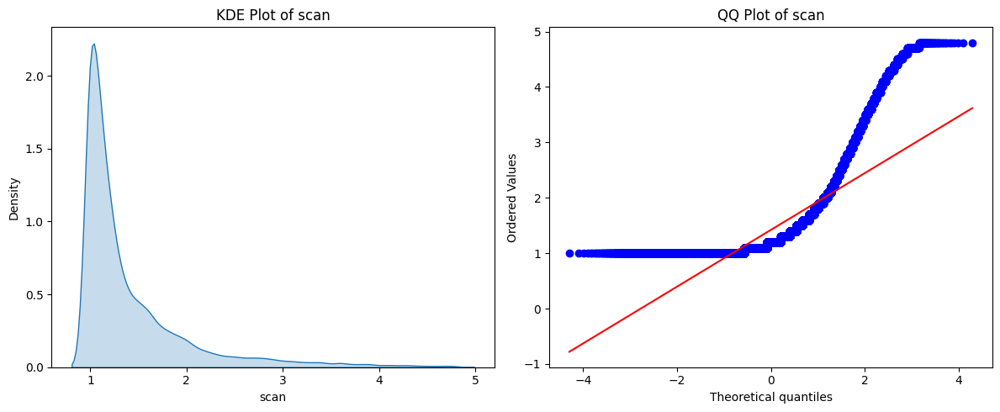

--------------------------------------------------
Analyzing distribution for: track


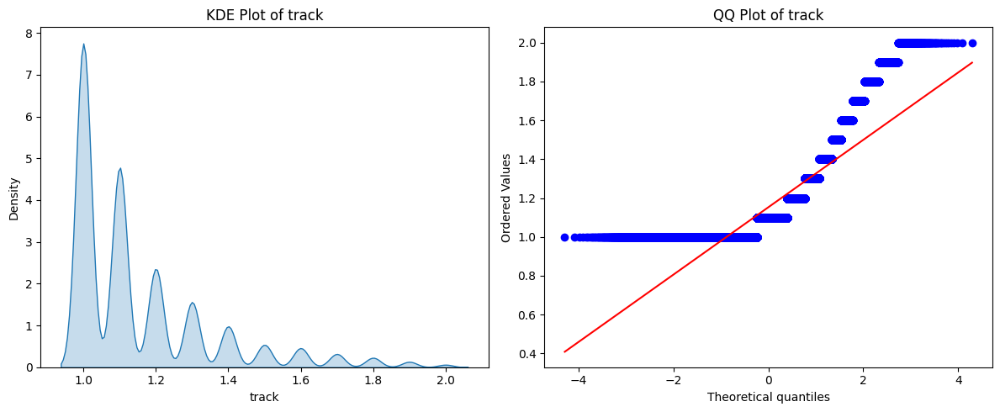

--------------------------------------------------


In [ ]:
import statsmodels.api as sm
import scipy.stats as stats

# List of numerical features to check for distribution
numerical_features = ['brightness', 'confidence', 'frp', 'bright_t31', 'scan', 'track']

for feature in numerical_features:
    print(f"Analyzing distribution for: {feature}")

    # KDE Plot
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    sns.kdeplot(df[feature], fill=True)
    plt.title(f'KDE Plot of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Density')

    # QQ Plot
    plt.subplot(1, 2, 2)
    stats.probplot(df[feature], dist="norm", plot=plt)
    plt.title(f'QQ Plot of {feature}')

    plt.tight_layout()
    plt.show()
    print("-" * 50)

Analyzing distribution for: brightness


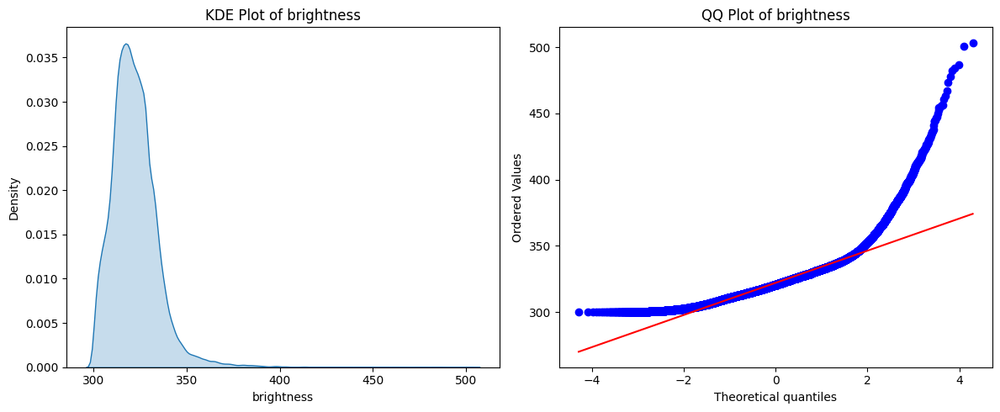

--------------------------------------------------
Analyzing distribution for: confidence


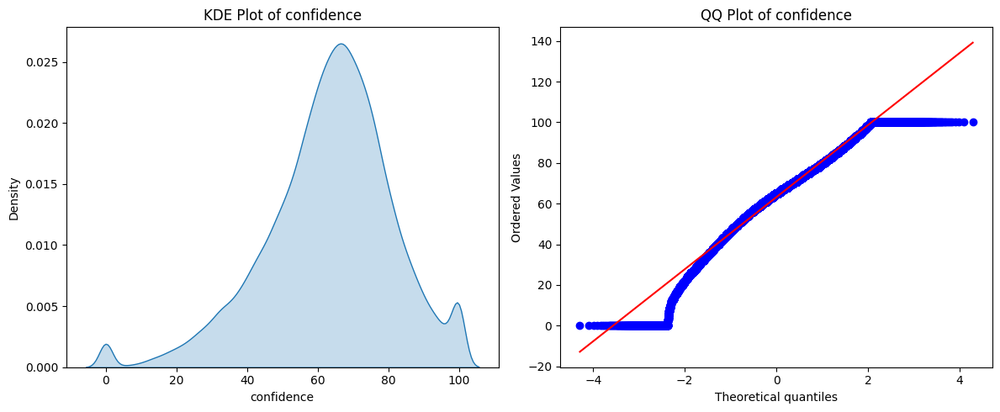

--------------------------------------------------
Analyzing distribution for: frp


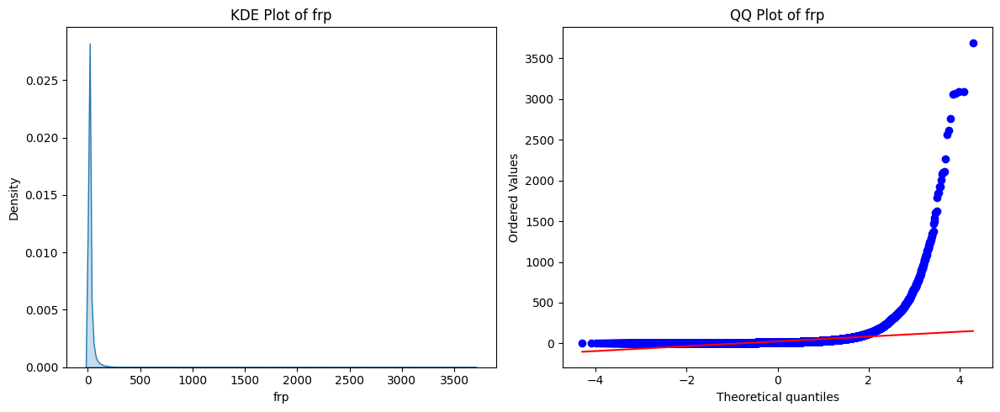

--------------------------------------------------
Analyzing distribution for: bright_t31


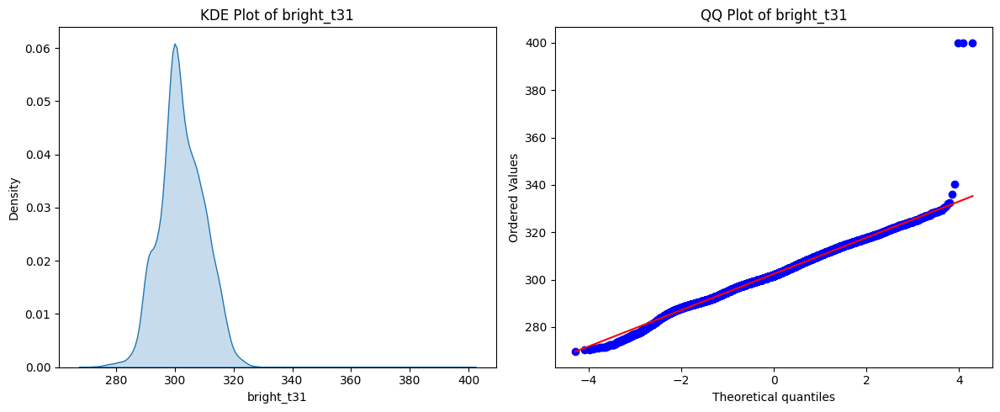

--------------------------------------------------
Analyzing distribution for: scan


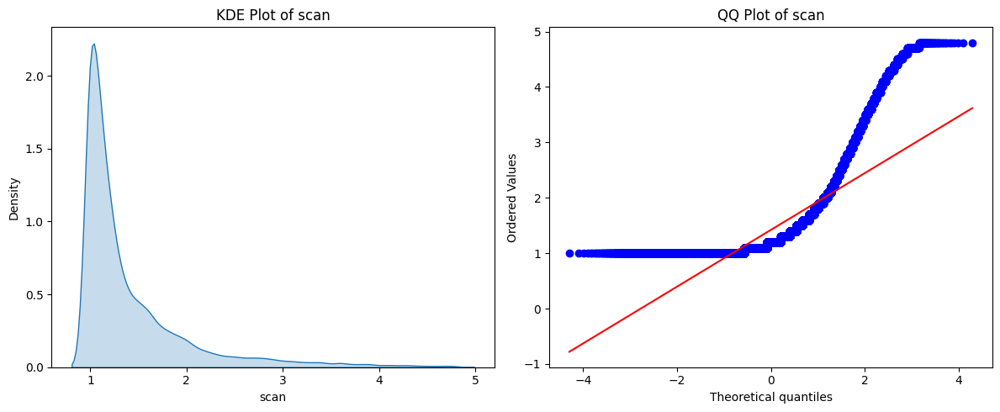

--------------------------------------------------
Analyzing distribution for: track


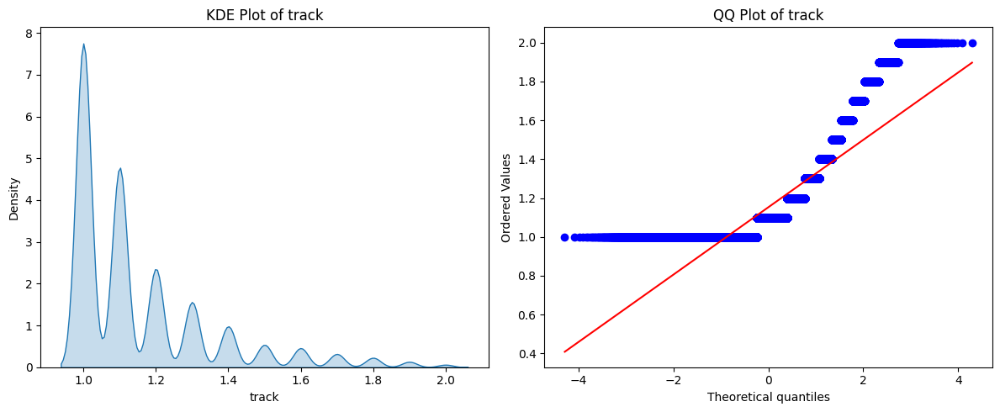

--------------------------------------------------


In [ ]:
import statsmodels.api as sm
import scipy.stats as stats

# List of numerical features to check for distribution
numerical_features = ['brightness', 'confidence', 'frp', 'bright_t31', 'scan', 'track']

for feature in numerical_features:
    print(f"Analyzing distribution for: {feature}")

    # KDE Plot
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    sns.kdeplot(df[feature], fill=True)
    plt.title(f'KDE Plot of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Density')

    # QQ Plot
    plt.subplot(1, 2, 2)
    stats.probplot(df[feature], dist="norm", plot=plt)
    plt.title(f'QQ Plot of {feature}')

    plt.tight_layout()
    plt.show()
    print("-" * 50)

In [ ]:
# --- Temporal Analysis ---
# Convert 'acq_date' to datetime objects
df['acq_date'] = pd.to_datetime(df['acq_date'])
# Extract temporal features
df['year'] = df['acq_date'].dt.year
df['month'] = df['acq_date'].dt.month
df['day_of_week'] = df['acq_date'].dt.dayofweek # Monday=0, Sunday=6
df['day_of_year'] = df['acq_date'].dt.dayofyear
df['hour'] = df['acq_time'].astype(str).str[:2].astype(int) # Assuming acq_time is HHMM

/tmp/ipython-input-24-167244582.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='month', palette='viridis')


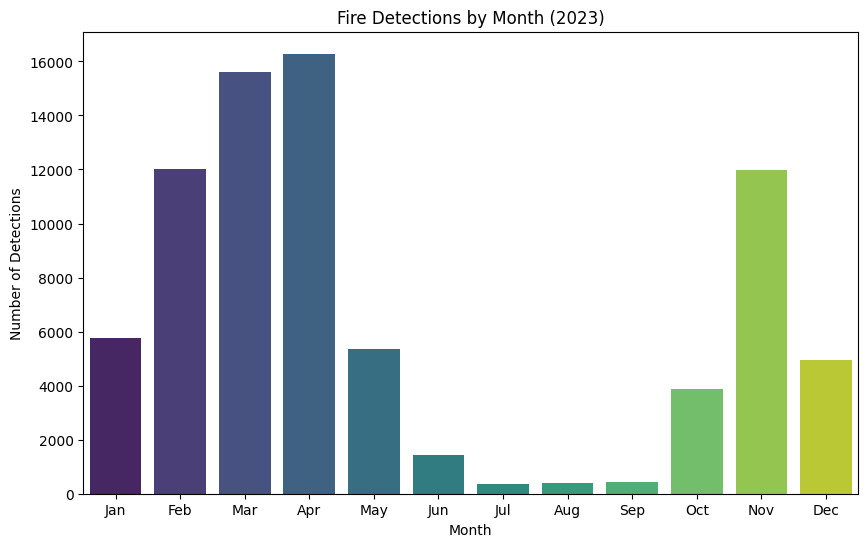

In [ ]:
# Visualize fire detections over months
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='month', palette='viridis')
plt.title('Fire Detections by Month (2023)')
plt.xlabel('Month')
plt.ylabel('Number of Detections')
plt.xticks(ticks=range(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()


/tmp/ipython-input-25-714612371.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='day_of_week', palette='viridis')


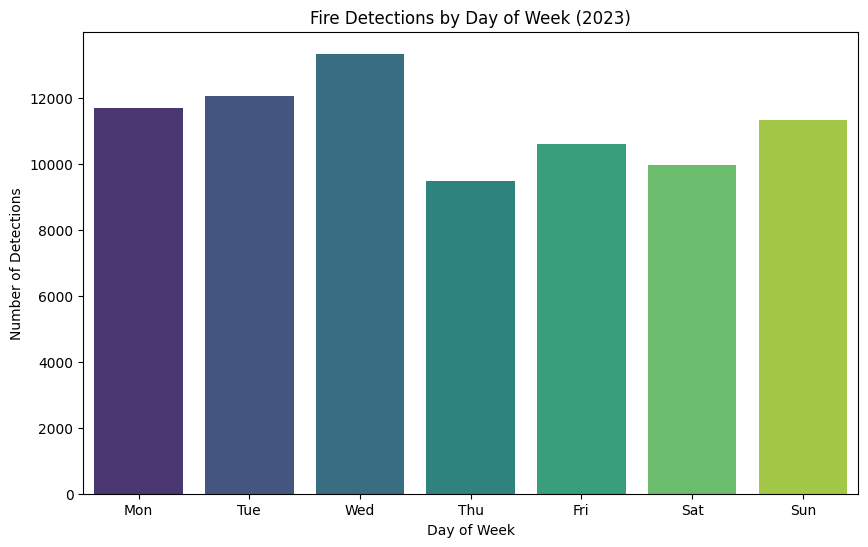

In [ ]:
# Visualize fire detections by day of the week
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='day_of_week', palette='viridis')
plt.title('Fire Detections by Day of Week (2023)')
plt.xlabel('Day of Week')
plt.ylabel('Number of Detections')
plt.xticks(ticks=range(7), labels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
plt.show()

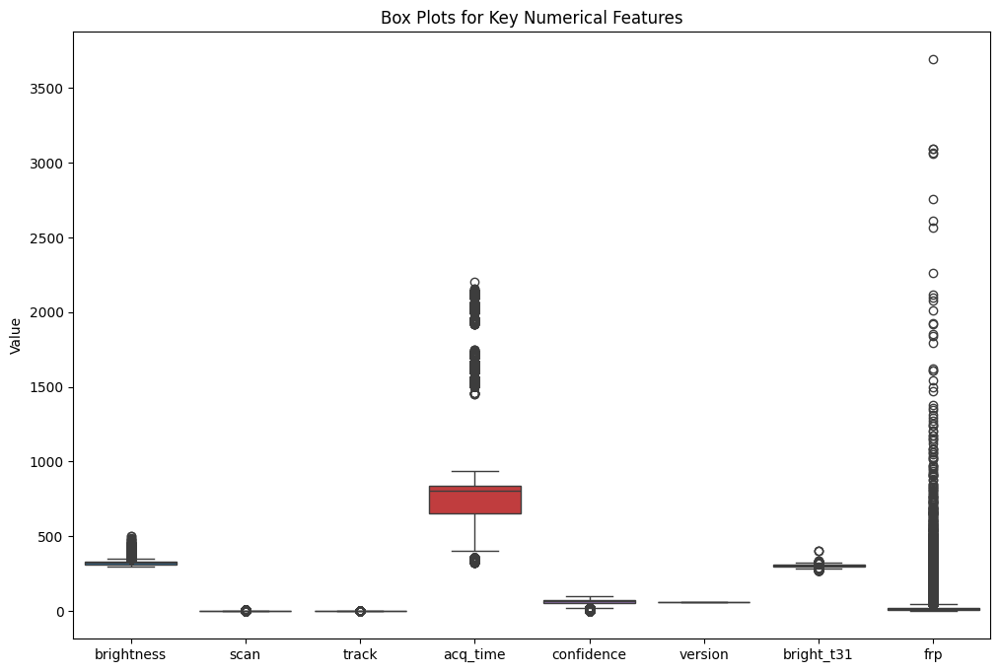

In [ ]:
# Visualize outliers using box plots for key numerical features
plt.figure(figsize=(12, 8))
sns.boxplot(data=df[numerical_cols])
plt.title('Box Plots for Key Numerical Features')
plt.ylabel('Value')
plt.show()

In [ ]:
def remove_outliers_iqr(df, column):
  Q1 = df[column].quantile(0.25)
  Q3 = df[column].quantile(0.75)
  IQR = Q3 - Q1
  lower_bound = Q1 - 1.5 * IQR
  upper_bound = Q3 + 1.5 * IQR
  df_cleaned = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)].copy()
  return df_cleaned

# Apply outlier removal to numerical columns
for col in numerical_cols:
  df = remove_outliers_iqr(df, col)

print("Shape after removing outliers:", df.shape)

Shape after removing outliers: (54318, 20)


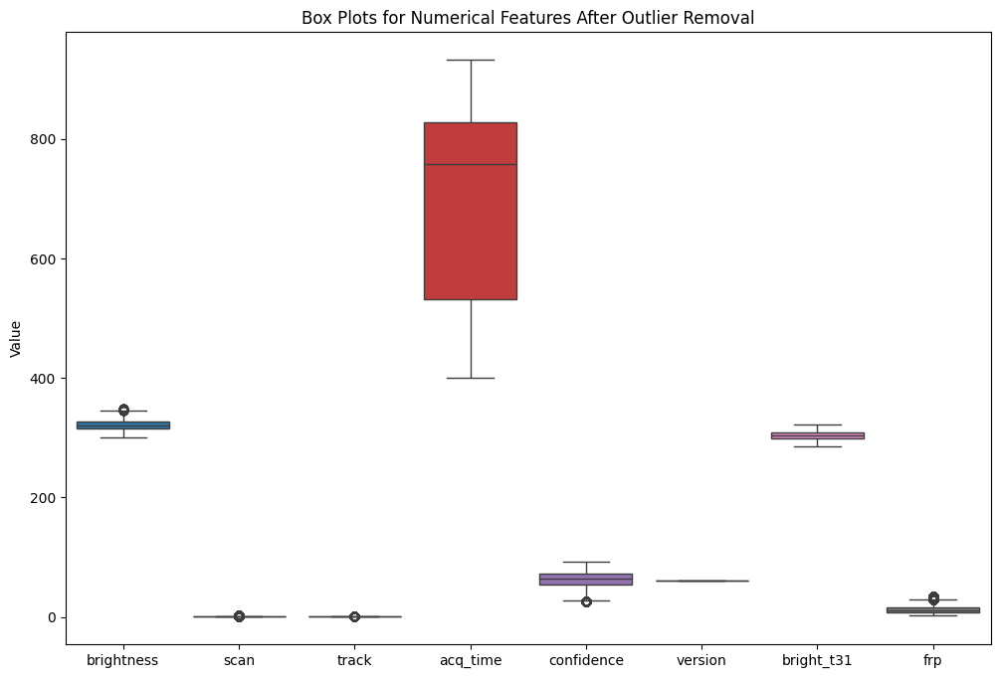

In [ ]:
# Visualize box plots after outlier removal
plt.figure(figsize=(12, 8))
sns.boxplot(data=df[numerical_cols])
plt.title('Box Plots for Numerical Features After Outlier Removal')
plt.ylabel('Value')
plt.show()

In [ ]:
df.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type,year,month,day_of_week,day_of_year,hour
0,9.3280,77.6247,318.0,1.1,1.0,2023-01-01,821,Aqua,MODIS,62,61.03,305.0,7.6,D,0,2023,1,6,1,82
1,10.4797,77.9378,313.8,1.0,1.0,2023-01-01,822,Aqua,MODIS,58,61.03,299.4,4.3,D,0,2023,1,6,1,82
2,13.2478,77.2639,314.7,1.0,1.0,2023-01-01,822,Aqua,MODIS,55,61.03,302.4,4.9,D,0,2023,1,6,1,82
3,12.2994,78.4085,314.3,1.0,1.0,2023-01-01,822,Aqua,MODIS,58,61.03,301.9,4.8,D,0,2023,1,6,1,82
5,14.1707,75.4922,322.2,1.2,1.1,2023-01-01,823,Aqua,MODIS,66,61.03,301.7,16.0,D,0,2023,1,6,1,82


In [ ]:
df.type.value_counts()


,count
type,
0,52188
2,2125
3,5


In [ ]:
categorical_cols = df.select_dtypes(include='object').columns

In [ ]:
categorical_cols

Index(['satellite', 'instrument', 'daynight'], dtype='object')

In [ ]:
# Select categorical columns for encoding
categorical_cols_to_encode = ['daynight', 'satellite', 'instrument']

# Apply One-Hot Encoding
df_encoded = pd.get_dummies(df, columns=categorical_cols_to_encode, drop_first=True)

In [ ]:
df_encoded.head(100)

,latitude,longitude,brightness,scan,track,acq_date,acq_time,confidence,version,bright_t31,frp,type,year,month,day_of_week,day_of_year,hour,satellite_Terra
0,9.3280,77.6247,318.0,1.1,1.0,2023-01-01,821,62,61.03,305.0,7.6,0,2023,1,6,1,82,False
1,10.4797,77.9378,313.8,1.0,1.0,2023-01-01,822,58,61.03,299.4,4.3,0,2023,1,6,1,82,False
2,13.2478,77.2639,314.7,1.0,1.0,2023-01-01,822,55,61.03,302.4,4.9,0,2023,1,6,1,82,False
3,12.2994,78.4085,314.3,1.0,1.0,2023-01-01,822,58,61.03,301.9,4.8,0,2023,1,6,1,82,False
5,14.1707,75.4922,322.2,1.2,1.1,2023-01-01,823,66,61.03,301.7,16.0,0,2023,1,6,1,82,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105,25.8284,78.4208,306.3,1.2,1.1,2023-01-01,826,53,61.03,293.3,6.8,0,2023,1,6,1,82,False
106,25.3302,73.2272,316.4,1.1,1.0,2023-01-01,826,66,61.03,302.1,8.9,0,2023,1,6,1,82,False
107,25.3285,73.2164,328.0,1.1,1.1,2023-01-01,826,81,61.03,303.4,23.2,0,2023,1,6,1,82,False
108,26.7407,73.2001,335.4,1.1,1.0,2023-01-01,826,86,61.03,301.4,31.1,0,2023,1,6,1,82,False


In [ ]:
df_encoded.type.value_counts()

,count
type,
0,52188
2,2125
3,5


In [ ]:
# !pip install folium
import folium

# Create map and sample data
india_map = folium.Map(location=[22.351115, 78.667743], zoom_start=5)
sample_df = df_encoded.sample(n=min(10000, len(df_encoded)), random_state=42)

# Add markers
for _, row in sample_df.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,
        color='red',
        fill=True,
        fill_opacity=0.6,
        popup=f"FRP: {row['frp']:.2f}, Date: {row['acq_date'].strftime('%Y-%m-%d')}"
    ).add_to(india_map)

display(india_map)

In [3]:
# Step 1: Import libraries
import pandas as pd
from sklearn.preprocessing import StandardScaler

# Step 2: Upload your dataset
from google.colab import files
uploaded = files.upload()

# Step 3: Load dataset into DataFrame (replace 'yourfile.csv' with actual filename from upload)
df = pd.read_csv(list(uploaded.keys())[0])  # This auto-detects uploaded file

# Optional: Check data
print(df.head())

# Step 4: One-hot encode categorical columns (update column names accordingly)
# Example categorical column: 'daynight'
df_encoded = pd.get_dummies(df, columns=['daynight'], drop_first=True)

# Step 5: Scale numerical columns
scaler = StandardScaler()
numerical_cols_to_scale = ['brightness', 'scan', 'track', 'confidence', 'bright_t31', 'frp']  # change as needed
df_encoded[numerical_cols_to_scale] = scaler.fit_transform(df_encoded[numerical_cols_to_scale])

# Step 6: View result
print(df_encoded.head())


Saving modis_2021_India.csv to modis_2021_India.csv
   latitude  longitude  brightness  scan  track    acq_date  acq_time  \
0   28.0993    96.9983       303.0   1.1    1.1  2021-01-01       409   
1   30.0420    79.6492       301.8   1.4    1.2  2021-01-01       547   
2   30.0879    78.8579       300.2   1.3    1.1  2021-01-01       547   
3   30.0408    80.0501       302.0   1.5    1.2  2021-01-01       547   
4   30.6565    78.9668       300.9   1.3    1.1  2021-01-01       547   

  satellite instrument  confidence  version  bright_t31   frp daynight  type  
0     Terra      MODIS          44     6.03       292.6   8.6        D     0  
1     Terra      MODIS          37     6.03       287.4   9.0        D     0  
2     Terra      MODIS           8     6.03       286.5   5.4        D     0  
3     Terra      MODIS          46     6.03       287.7  10.7        D     0  
4     Terra      MODIS          43     6.03       287.6   9.0        D     0  
   latitude  longitude  brightness 

Saving modis_2021_India.csv to modis_2021_India (1).csv


In [5]:
from google.colab import files
uploaded = files.upload()

Saving modis_2022_India.csv to modis_2022_India.csv


In [6]:
from google.colab import files
uploaded = files.upload()

Saving modis_2023_India.csv to modis_2023_India.csv


In [7]:
scaler = StandardScaler()
numerical_cols_to_scale = ['brightness', 'scan', 'track', 'confidence', 'bright_t31', 'frp']
df_encoded[numerical_cols_to_scale] = scaler.fit_transform(df_encoded[numerical_cols_to_scale])
df_encoded.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,type,daynight_N
0,28.0993,96.9983,-1.476703,-0.506338,-0.260191,2021-01-01,409,Terra,MODIS,-1.111868,6.03,-1.380106,-0.234153,0,False
1,30.0420,79.6492,-1.557892,-0.036662,0.231549,2021-01-01,547,Terra,MODIS,-1.493295,6.03,-1.996232,-0.229579,0,False
2,30.0879,78.8579,-1.666145,-0.193221,-0.260191,2021-01-01,547,Terra,MODIS,-3.073492,6.03,-2.102869,-0.270752,0,False
3,30.0408,80.0501,-1.544361,0.119896,0.231549,2021-01-01,547,Terra,MODIS,-1.002889,6.03,-1.960686,-0.210136,0,False
4,30.6565,78.9668,-1.618784,-0.193221,-0.260191,2021-01-01,547,Terra,MODIS,-1.166358,6.03,-1.972535,-0.229579,0,False


In [8]:
df_encoded.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 111267 entries, 0 to 111266
Data columns (total 15 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   latitude    111267 non-null  float64
 1   longitude   111267 non-null  float64
 2   brightness  111267 non-null  float64
 3   scan        111267 non-null  float64
 4   track       111267 non-null  float64
 5   acq_date    111267 non-null  object 
 6   acq_time    111267 non-null  int64  
 7   satellite   111267 non-null  object 
 8   instrument  111267 non-null  object 
 9   confidence  111267 non-null  float64
 10  version     111267 non-null  float64
 11  bright_t31  111267 non-null  float64
 12  frp         111267 non-null  float64
 13  type        111267 non-null  int64  
 14  daynight_N  111267 non-null  bool   
dtypes: bool(1), float64(9), int64(2), object(3)
memory usage: 12.0+ MB


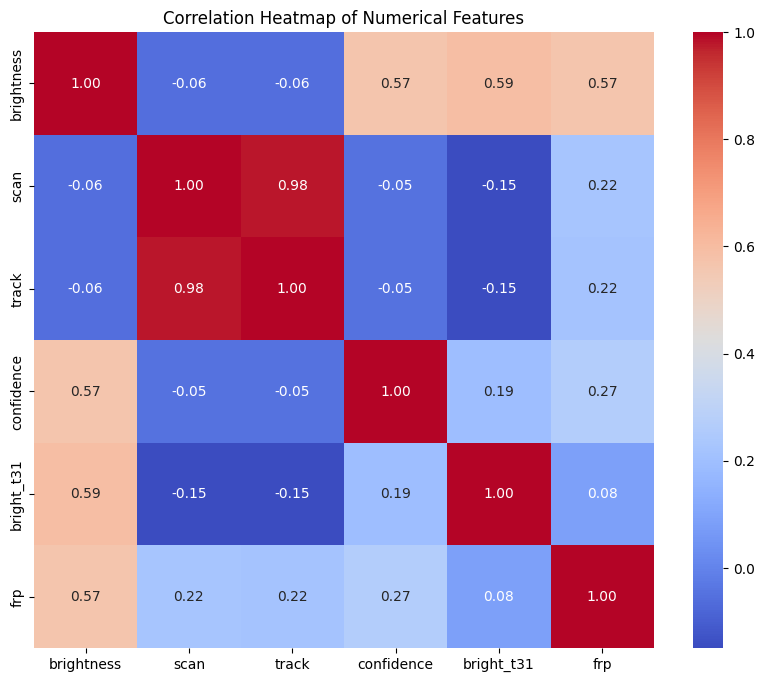

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

# Heatmap of correlations between numerical features
plt.figure(figsize=(10, 8))
correlation_matrix = df_encoded[['brightness', 'scan', 'track', 'confidence', 'bright_t31', 'frp']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap of Numerical Features')
plt.show()



In [11]:
df_encoded.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,type,daynight_N
0,28.0993,96.9983,-1.476703,-0.506338,-0.260191,2021-01-01,409,Terra,MODIS,-1.111868,6.03,-1.380106,-0.234153,0,False
1,30.0420,79.6492,-1.557892,-0.036662,0.231549,2021-01-01,547,Terra,MODIS,-1.493295,6.03,-1.996232,-0.229579,0,False
2,30.0879,78.8579,-1.666145,-0.193221,-0.260191,2021-01-01,547,Terra,MODIS,-3.073492,6.03,-2.102869,-0.270752,0,False
3,30.0408,80.0501,-1.544361,0.119896,0.231549,2021-01-01,547,Terra,MODIS,-1.002889,6.03,-1.960686,-0.210136,0,False
4,30.6565,78.9668,-1.618784,-0.193221,-0.260191,2021-01-01,547,Terra,MODIS,-1.166358,6.03,-1.972535,-0.229579,0,False


In [12]:
df_encoded.type.value_counts()

,count
type,
0,106940
2,4314
3,13


In [14]:
# Separate features (X) and target variable (y)
# Assuming 'type' is the target variable you want to predict
# Drop temporal features if not intended for prediction task that uses 'type' as target
features = ['brightness', 'scan', 'track', 'confidence', 'bright_t31', 'frp']
target = 'type'

X = df_encoded[features]
y = df_encoded[target]

In [15]:
X

,brightness,scan,track,confidence,bright_t31,frp
0,-1.476703,-0.506338,-0.260191,-1.111868,-1.380106,-0.234153
1,-1.557892,-0.036662,0.231549,-1.493295,-1.996232,-0.229579
2,-1.666145,-0.193221,-0.260191,-3.073492,-2.102869,-0.270752
3,-1.544361,0.119896,0.231549,-1.002889,-1.960686,-0.210136
4,-1.618784,-0.193221,-0.260191,-1.166358,-1.972535,-0.229579
...,...,...,...,...,...,...
111262,-1.145180,0.119896,0.231549,0.468328,-1.628926,-0.148376
111263,-1.463172,-0.662896,-0.751931,-0.566973,-1.925140,-0.258171
111264,-1.402280,-0.662896,-0.751931,-0.294525,-1.901443,-0.250165
111265,-1.260198,-0.349779,-0.260191,0.032412,-1.948837,-0.208992


In [17]:
y

,type
0,0
1,0
2,0
3,0
4,0
...,...
111262,2
111263,0
111264,0
111265,2


In [18]:
!pip install -U imbalanced-learn
from imblearn.over_sampling import SMOTE

In [19]:
# Initialize SMOTE
smote = SMOTE(random_state=42)

# Apply SMOTE to the training data
X_resampled, y_resampled = smote.fit_resample(X, y)

# Check the distribution of the target variable after resampling
print("Distribution of target variable after SMOTE:")
print(y_resampled.value_counts())

Distribution of target variable after SMOTE:
type
0    106940
2    106940
3    106940
Name: count, dtype: int64


In [21]:
from sklearn.model_selection import train_test_split

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.25, random_state=42, stratify=y_resampled
)


In [22]:
print("Shape of X_train:", X_train.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of y_test:", y_test.shape)

Shape of X_train: (240615, 6)
Shape of X_test: (80205, 6)
Shape of y_train: (240615,)
Shape of y_test: (80205,)


In [24]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

# Train Logistic Regression
loreg = LogisticRegression(max_iter=200)
loreg.fit(X_train, y_train)

# Make predictions
loreg_pred = loreg.predict(X_test)

# Evaluate
score = accuracy_score(y_test, loreg_pred)
cr = classification_report(y_test, loreg_pred)

# Output
print("Logistic Regression")
print("Accuracy Score value: {:.4f}".format(score))
print(cr)


Logistic Regression
Accuracy Score value: 0.6309
              precision    recall  f1-score   support

           0       0.70      0.60      0.65     26735
           2       0.58      0.54      0.56     26735
           3       0.62      0.76      0.68     26735

    accuracy                           0.63     80205
   macro avg       0.63      0.63      0.63     80205
weighted avg       0.63      0.63      0.63     80205



In [25]:
from sklearn.tree import DecisionTreeClassifier
dtc = DecisionTreeClassifier()
dtc.fit(X_train,y_train)
dtc_pred = dtc.predict(X_test)
score = accuracy_score(y_test,dtc_pred)
cr = classification_report(y_test,dtc_pred)

print("Decision Tree")
print ("Accuracy Score value: {:.4f}".format(score))
print (cr)

Decision Tree
Accuracy Score value: 0.9472
              precision    recall  f1-score   support

           0       0.93      0.91      0.92     26735
           2       0.91      0.93      0.92     26735
           3       1.00      1.00      1.00     26735

    accuracy                           0.95     80205
   macro avg       0.95      0.95      0.95     80205
weighted avg       0.95      0.95      0.95     80205



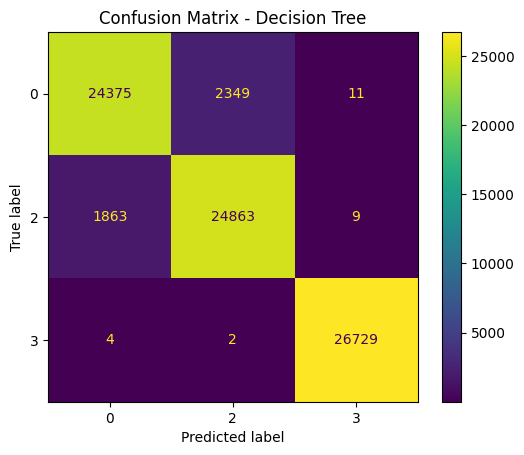

In [27]:
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Assuming `dtc` is your trained Decision Tree model
dt_cm = ConfusionMatrixDisplay.from_estimator(dtc, X_test, y_test)
dt_cm.ax_.set_title("Confusion Matrix - Decision Tree")
plt.show()


In [29]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

# Train Random Forest
rfc = RandomForestClassifier()
rfc.fit(X_train, y_train)

# Predict
rfc_pred = rfc.predict(X_test)

# Evaluate
score = accuracy_score(y_test, rfc_pred)
cr = classification_report(y_test, rfc_pred)

# Print results
print("Random Forest Classifier")
print("Accuracy Score: {:.4f}".format(score))
print(cr)


KeyboardInterrupt: 

In [30]:
rfc = RandomForestClassifier()
rfc.fit(X_train,y_train)
rfc_pred = rfc.predict(X_test)
score = accuracy_score(y_test,rfc_pred)
cr = classification_report(y_test,rfc_pred)

print("Random Forest")
print ("Accuracy Score value: {:.4f}".format(score))
print (cr)

Random Forest
Accuracy Score value: 0.9730
              precision    recall  f1-score   support

           0       0.97      0.95      0.96     26735
           2       0.95      0.97      0.96     26735
           3       1.00      1.00      1.00     26735

    accuracy                           0.97     80205
   macro avg       0.97      0.97      0.97     80205
weighted avg       0.97      0.97      0.97     80205



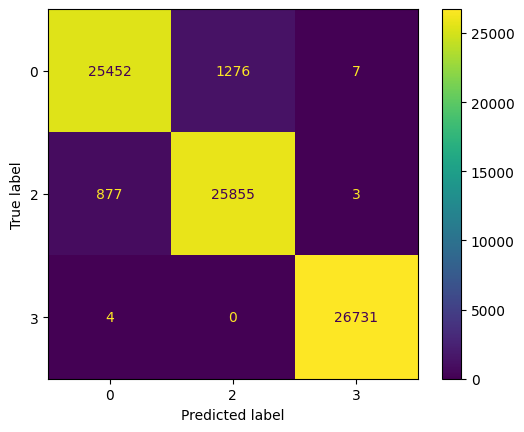

In [31]:
rf_cm = ConfusionMatrixDisplay.from_estimator(rfc, X_test, y_test)

In [33]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report

# Train K-Nearest Neighbors
knnc = KNeighborsClassifier()
knnc.fit(X_train, y_train)

# Predict
knn_pred = knnc.predict(X_test)

# Evaluate
score = accuracy_score(y_test, knn_pred)
cr = classification_report(y_test, knn_pred)

# Output
print("K-Nearest Neighbors Classifier")
print("Accuracy Score: {:.4f}".format(score))
print(cr)


K-Nearest Neighbors Classifier
Accuracy Score: 0.9309
              precision    recall  f1-score   support

           0       0.97      0.82      0.89     26735
           2       0.84      0.98      0.91     26735
           3       1.00      1.00      1.00     26735

    accuracy                           0.93     80205
   macro avg       0.94      0.93      0.93     80205
weighted avg       0.94      0.93      0.93     80205



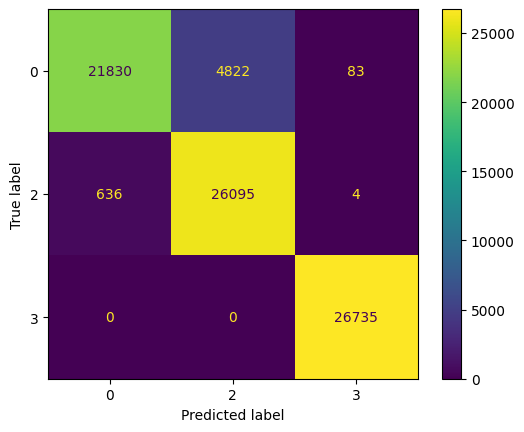

In [34]:
knn_cm = ConfusionMatrixDisplay.from_estimator(knnc, X_test, y_test)

In [35]:
# Collect the accuracies of each model
model_accuracies = {
    "Logistic Regression": accuracy_score(y_test, loreg_pred),
    "Decision Tree": accuracy_score(y_test, dtc_pred),
    "Random Forest": accuracy_score(y_test, rfc_pred),
    "KNeighbors Classifier": accuracy_score(y_test, knn_pred)
}

# Find the best model
best_model_name = max(model_accuracies, key=model_accuracies.get)
best_model_accuracy = model_accuracies[best_model_name]

print("Model Accuracies:")
for model, accuracy in model_accuracies.items():
    print(f"{model}: {accuracy:.4f}")

print(f"\nBest Model: {best_model_name} with Accuracy: {best_model_accuracy:.4f}")

Model Accuracies:
Logistic Regression: 0.6309
Decision Tree: 0.9472
Random Forest: 0.9730
KNeighbors Classifier: 0.9309

Best Model: Random Forest with Accuracy: 0.9730


In [36]:
import joblib

# Save the best model
# Based on the previous output, let's assume Random Forest was the best model.
best_model = rfc

joblib.dump(best_model, 'best_fire_detection_model.pkl')

# Save the StandardScaler instance
joblib.dump(scaler, 'scaler.pkl')

print("Best model and scaler saved successfully.")

Best model and scaler saved successfully.
